In [0]:
#Team 4 - Final Project: Public Sentiment, Kobe Bryant
#Part 2
#IST736 - Text Mining
#Date: 03/20/2020

In [0]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import re
from bs4 import BeautifulSoup
from nltk.tokenize import WordPunctTokenizer
from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import nltk
import random
from nltk.tokenize import word_tokenize
from collections import Counter
from wordcloud import WordCloud

In [0]:
df = pd.read_csv('cleandata.csv')

/opt/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning: Columns (7,8,10,11) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [0]:
df.head()

,Unnamed: 0,id,created_at,source,original_text,clean_text,sentiment,polarity,subjectivity,lang,favorite_count,retweet_count,original_author,possibly_sensitive,hashtags,user_mentions,place,place_coord_boundaries
0,1,1,Tue Jan 28 23:59:59 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...","RT @michaeleaves: As I knew she would, @elledu...",RT michaeleaves As I knew would elleduncanESPN...,"Sentiment(polarity=0.8, subjectivity=1.0)",0.8,1,en,0,988,Chumdawg19,NaN,KobeBryant,"michaeleaves, elleduncanESPN",NaN,NaN
1,2,2,Tue Jan 28 23:59:58 +0000 2020,"<a href=""http://twitter.com/download/android"" ...",Seeing #girldad trending and all these amazing...,Seeing girldad trending amazing fathers love d...,"Sentiment(polarity=0.55, subjectivity=0.75)",0.55,0.75,en,1,0,Swiftie13152289,NaN,girldad,NaN,"Illinois, USA",NaN
2,3,3,Tue Jan 28 23:59:57 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...",RT @elleduncanESPN: I’m so moved by the outpou...,RT elleduncanESPN I ’ moved outpouring support...,"Sentiment(polarity=0.04999999999999999, subjec...",0.05,0.65,en,0,0,richhgiiirl,NaN,girldad,elleduncanESPN,NaN,NaN
3,4,4,Tue Jan 28 23:59:56 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...",RT @cafulezi: First son of a Nigerian (Igbo) f...,RT cafulezi First son Nigerian Igbo first son ...,"Sentiment(polarity=0.25, subjectivity=0.333333...",0.25,0.333333333,en,91,0,Marley_yabish,NaN,NaN,cafulezi,NaN,NaN
4,5,5,Tue Jan 28 23:59:55 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...","RT @michaeleaves: As I knew she would, @elledu...",RT michaeleaves As I knew would elleduncanESPN...,"Sentiment(polarity=0.8, subjectivity=1.0)",0.8,1,en,0,17954,Monyka,NaN,KobeBryant,"michaeleaves, elleduncanESPN","Courtside, USA",NaN


In [0]:
sampleText = df['original_text']
samplePolarity = df['polarity']

prefix = ('@','#','http','�','♥️')
t = ('�','♥️','❤') 

In [0]:
counter = 0
for row in sampleText:
    row=row.lstrip()
    row=row.rstrip()
    myList = row.split(" ")
    newList = []
    
    for word in myList:
        word=word.lower()
        if word.startswith(prefix):
            word = word.replace(word,"")
            print(word)
        if word.endswith(t):
            word = word.replace(word,"")
        newList.append(word)
        
    print(newList)
    #' '.join(word[0] for word in newList)
    listToStr = ' '.join([str(elem) for elem in newList]) 
    sampleText[counter]=listToStr
    counter = counter + 1




['rt', '', 'as', 'i', 'knew', 'she', 'would,', '', 'brought', 'a', 'much-needed', 'perspective', 'to', 'the', 'death', 'of', '', 'proud', 'of', 'you,', 'sis!', '\nh…']

['seeing', '', 'trending', 'and', 'all', 'these', 'amazing', 'fathers', 'that', 'love', 'their', 'daughters', 'is', 'making', 'me', 'so', '']


['rt', '', 'i’m', 'so', 'moved', 'by', 'the', 'outpouring', 'of', 'support', 'behind', 'my', 'story', 'about', 'kobe.', 'and', 'i', 'love', 'that', '', 'is', 'trending..', 'so', 'for', 'all…']

['rt', '', 'first', 'son', 'of', 'a', 'nigerian', '(igbo)', 'first', 'son.', 'having', 'a', 'boy', 'is', 'basically', 'mandatory,', 'they', 'said.', 'to', 'carry', 'the', 'name,', 'they', 'said\n\nyeah,…']



['rt', '', 'as', 'i', 'knew', 'she', 'would,', '', 'brought', 'a', 'much-needed', 'perspective', 'to', 'the', 'death', 'of', '', 'proud', 'of', 'you,', 'sis!', '\nh…']



['rt', '', 'this', 'oscar', 'winning', 'short', 'film', 'about', '', 'hit', 'different', 'right', 'now.', 'rip

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



['rt', '', 'this', 'is', 'the', 'final', 'scene', 'of', 'the', 'doc', '\n"kobe', 'doing', 'work"', 'by', 'spike', 'lee\non', 'the', 'court,', 'kobe', 'was', 'an', 'assassin.', 'he', 'wanted', 'to', 'dro…']


['rt', '', '', 'grew', 'up', 'in', 'italy,', 'a', 'place', 'he', "loved.\nhere's", 'a', 'picture', 'of', 'him', 'at', 'a', 'basketball', 'camp', 'in', 'pistoia', 'attending', 'a', 'clini…']



['rt', '', 'this', 'touching', 'tribute', 'to', 'kobe', 'and', 'gianna', 'inspires', '', '—', '', 'proud', 'fathers', 'sharing', 'photos', 'with', 'their', 'daughters', '💛💜:', '']



['rt', '', 'as', 'i', 'knew', 'she', 'would,', '', 'brought', 'a', 'much-needed', 'perspective', 'to', 'the', 'death', 'of', '', 'proud', 'of', 'you,', 'sis!', '\nh…']

['the', 'relationship', 'between', 'kobe', 'and', 'gigi', 'definitely', 'hit', 'home', 'for', 'me.', 'helps', 'you', 'cherish', 'those', 'moments', 'and', 'put', 'shit', 'int…', '']




['', 'shredding', 'the', 'pow', 'pow', 'with', '', '', '']



In [0]:
sampleText[0:10]

0    rt  as i knew she would,  brought a much-neede...
1    seeing  trending and all these amazing fathers...
2    rt  i’m so moved by the outpouring of support ...
3    rt  first son of a nigerian (igbo) first son. ...
4    rt  as i knew she would,  brought a much-neede...
5    rt  this oscar winning short film about  hit d...
6                rt  what a tragic loss...      )     
7    rt  as i knew she would,  brought a much-neede...
8    rt  kobe wakes up in heaven this morning, a tr...
9                      all these  posts are making me 
Name: original_text, dtype: object

In [0]:
df['new_sentiment'] = df['original_text'].apply(lambda tweet: TextBlob(tweet).sentiment.polarity)

In [0]:
df.head()

,Unnamed: 0,id,created_at,source,original_text,clean_text,sentiment,polarity,subjectivity,lang,favorite_count,retweet_count,original_author,possibly_sensitive,hashtags,user_mentions,place,place_coord_boundaries,new_sentiment
0,1,1,Tue Jan 28 23:59:59 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...","rt as i knew she would, brought a much-neede...",RT michaeleaves As I knew would elleduncanESPN...,"Sentiment(polarity=0.8, subjectivity=1.0)",0.8,1,en,0,988,Chumdawg19,NaN,KobeBryant,"michaeleaves, elleduncanESPN",NaN,NaN,1.00
1,2,2,Tue Jan 28 23:59:58 +0000 2020,"<a href=""http://twitter.com/download/android"" ...",seeing trending and all these amazing fathers...,Seeing girldad trending amazing fathers love d...,"Sentiment(polarity=0.55, subjectivity=0.75)",0.55,0.75,en,1,0,Swiftie13152289,NaN,girldad,NaN,"Illinois, USA",NaN,0.55
2,3,3,Tue Jan 28 23:59:57 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...",rt i’m so moved by the outpouring of support ...,RT elleduncanESPN I ’ moved outpouring support...,"Sentiment(polarity=0.04999999999999999, subjec...",0.05,0.65,en,0,0,richhgiiirl,NaN,girldad,elleduncanESPN,NaN,NaN,0.05
3,4,4,Tue Jan 28 23:59:56 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...",rt first son of a nigerian (igbo) first son. ...,RT cafulezi First son Nigerian Igbo first son ...,"Sentiment(polarity=0.25, subjectivity=0.333333...",0.25,0.333333333,en,91,0,Marley_yabish,NaN,NaN,cafulezi,NaN,NaN,0.25
4,5,5,Tue Jan 28 23:59:55 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...","rt as i knew she would, brought a much-neede...",RT michaeleaves As I knew would elleduncanESPN...,"Sentiment(polarity=0.8, subjectivity=1.0)",0.8,1,en,0,17954,Monyka,NaN,KobeBryant,"michaeleaves, elleduncanESPN","Courtside, USA",NaN,1.00


In [0]:
df['date'] = df['created_at'].str.extract('([a-zA-Z]+\s[0-9]{2})', expand=True)
df['time'] = df['created_at'].str.extract('([0-9]{2}:[0-9]{2}:[0-9]{2})', expand=True)
df.head()

,Unnamed: 0,id,created_at,source,original_text,clean_text,sentiment,polarity,subjectivity,lang,...,retweet_count,original_author,possibly_sensitive,hashtags,user_mentions,place,place_coord_boundaries,new_sentiment,date,time
0,1,1,Tue Jan 28 23:59:59 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...","rt as i knew she would, brought a much-neede...",RT michaeleaves As I knew would elleduncanESPN...,"Sentiment(polarity=0.8, subjectivity=1.0)",0.8,1,en,...,988,Chumdawg19,NaN,KobeBryant,"michaeleaves, elleduncanESPN",NaN,NaN,1.00,Jan 28,23:59:59
1,2,2,Tue Jan 28 23:59:58 +0000 2020,"<a href=""http://twitter.com/download/android"" ...",seeing trending and all these amazing fathers...,Seeing girldad trending amazing fathers love d...,"Sentiment(polarity=0.55, subjectivity=0.75)",0.55,0.75,en,...,0,Swiftie13152289,NaN,girldad,NaN,"Illinois, USA",NaN,0.55,Jan 28,23:59:58
2,3,3,Tue Jan 28 23:59:57 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...",rt i’m so moved by the outpouring of support ...,RT elleduncanESPN I ’ moved outpouring support...,"Sentiment(polarity=0.04999999999999999, subjec...",0.05,0.65,en,...,0,richhgiiirl,NaN,girldad,elleduncanESPN,NaN,NaN,0.05,Jan 28,23:59:57
3,4,4,Tue Jan 28 23:59:56 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...",rt first son of a nigerian (igbo) first son. ...,RT cafulezi First son Nigerian Igbo first son ...,"Sentiment(polarity=0.25, subjectivity=0.333333...",0.25,0.333333333,en,...,0,Marley_yabish,NaN,NaN,cafulezi,NaN,NaN,0.25,Jan 28,23:59:56
4,5,5,Tue Jan 28 23:59:55 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...","rt as i knew she would, brought a much-neede...",RT michaeleaves As I knew would elleduncanESPN...,"Sentiment(polarity=0.8, subjectivity=1.0)",0.8,1,en,...,17954,Monyka,NaN,KobeBryant,"michaeleaves, elleduncanESPN","Courtside, USA",NaN,1.00,Jan 28,23:59:55


In [0]:
def get_sec(time_str):
    """Get Seconds from time."""
    h, m, s = time_str.split(':')
    return int(h) * 3600 + int(m) * 60 + int(s)
print(df['time'][0])
print(get_sec(df['time'][0]))

23:59:59
86399


In [0]:
df = df[df.time.str.contains('([0-9]{2}:[0-9]{2}:[0-9]{2})', na=False)]
# remove tweets that have null in 'time'
df.head()

/opt/anaconda3/lib/python3.7/site-packages/pandas/core/strings.py:1843: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


,Unnamed: 0,id,created_at,source,original_text,clean_text,sentiment,polarity,subjectivity,lang,...,retweet_count,original_author,possibly_sensitive,hashtags,user_mentions,place,place_coord_boundaries,new_sentiment,date,time
0,1,1,Tue Jan 28 23:59:59 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...","rt as i knew she would, brought a much-neede...",RT michaeleaves As I knew would elleduncanESPN...,"Sentiment(polarity=0.8, subjectivity=1.0)",0.8,1,en,...,988,Chumdawg19,NaN,KobeBryant,"michaeleaves, elleduncanESPN",NaN,NaN,1.00,Jan 28,23:59:59
1,2,2,Tue Jan 28 23:59:58 +0000 2020,"<a href=""http://twitter.com/download/android"" ...",seeing trending and all these amazing fathers...,Seeing girldad trending amazing fathers love d...,"Sentiment(polarity=0.55, subjectivity=0.75)",0.55,0.75,en,...,0,Swiftie13152289,NaN,girldad,NaN,"Illinois, USA",NaN,0.55,Jan 28,23:59:58
2,3,3,Tue Jan 28 23:59:57 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...",rt i’m so moved by the outpouring of support ...,RT elleduncanESPN I ’ moved outpouring support...,"Sentiment(polarity=0.04999999999999999, subjec...",0.05,0.65,en,...,0,richhgiiirl,NaN,girldad,elleduncanESPN,NaN,NaN,0.05,Jan 28,23:59:57
3,4,4,Tue Jan 28 23:59:56 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...",rt first son of a nigerian (igbo) first son. ...,RT cafulezi First son Nigerian Igbo first son ...,"Sentiment(polarity=0.25, subjectivity=0.333333...",0.25,0.333333333,en,...,0,Marley_yabish,NaN,NaN,cafulezi,NaN,NaN,0.25,Jan 28,23:59:56
4,5,5,Tue Jan 28 23:59:55 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...","rt as i knew she would, brought a much-neede...",RT michaeleaves As I knew would elleduncanESPN...,"Sentiment(polarity=0.8, subjectivity=1.0)",0.8,1,en,...,17954,Monyka,NaN,KobeBryant,"michaeleaves, elleduncanESPN","Courtside, USA",NaN,1.00,Jan 28,23:59:55


In [0]:
df[df['time'].apply(lambda x: isinstance(x, float))]
# returns nothing, good!
len(df[df['time'].apply(lambda x: isinstance(x, float))])

0

In [0]:
df['timesec'] = df['time'].apply(get_sec)
df.head()

,Unnamed: 0,id,created_at,source,original_text,clean_text,sentiment,polarity,subjectivity,lang,...,original_author,possibly_sensitive,hashtags,user_mentions,place,place_coord_boundaries,new_sentiment,date,time,timesec
0,1,1,Tue Jan 28 23:59:59 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...","rt as i knew she would, brought a much-neede...",RT michaeleaves As I knew would elleduncanESPN...,"Sentiment(polarity=0.8, subjectivity=1.0)",0.8,1,en,...,Chumdawg19,NaN,KobeBryant,"michaeleaves, elleduncanESPN",NaN,NaN,1.00,Jan 28,23:59:59,86399
1,2,2,Tue Jan 28 23:59:58 +0000 2020,"<a href=""http://twitter.com/download/android"" ...",seeing trending and all these amazing fathers...,Seeing girldad trending amazing fathers love d...,"Sentiment(polarity=0.55, subjectivity=0.75)",0.55,0.75,en,...,Swiftie13152289,NaN,girldad,NaN,"Illinois, USA",NaN,0.55,Jan 28,23:59:58,86398
2,3,3,Tue Jan 28 23:59:57 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...",rt i’m so moved by the outpouring of support ...,RT elleduncanESPN I ’ moved outpouring support...,"Sentiment(polarity=0.04999999999999999, subjec...",0.05,0.65,en,...,richhgiiirl,NaN,girldad,elleduncanESPN,NaN,NaN,0.05,Jan 28,23:59:57,86397
3,4,4,Tue Jan 28 23:59:56 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...",rt first son of a nigerian (igbo) first son. ...,RT cafulezi First son Nigerian Igbo first son ...,"Sentiment(polarity=0.25, subjectivity=0.333333...",0.25,0.333333333,en,...,Marley_yabish,NaN,NaN,cafulezi,NaN,NaN,0.25,Jan 28,23:59:56,86396
4,5,5,Tue Jan 28 23:59:55 +0000 2020,"<a href=""http://twitter.com/download/iphone"" r...","rt as i knew she would, brought a much-neede...",RT michaeleaves As I knew would elleduncanESPN...,"Sentiment(polarity=0.8, subjectivity=1.0)",0.8,1,en,...,Monyka,NaN,KobeBryant,"michaeleaves, elleduncanESPN","Courtside, USA",NaN,1.00,Jan 28,23:59:55,86395


In [0]:
cleantwtdf = df[['id','date','time','timesec','original_text','hashtags','polarity','new_sentiment']]
cleantwtdf=cleantwtdf.rename(columns = {'original_text':'cleantext'})
cleantwtdf['polarity'] = cleantwtdf['polarity'].astype(float)
cleantwtdf.head()
len(cleantwtdf) # 35,836

35836

In [0]:
sentiment_df = cleantwtdf[['cleantext','new_sentiment']]

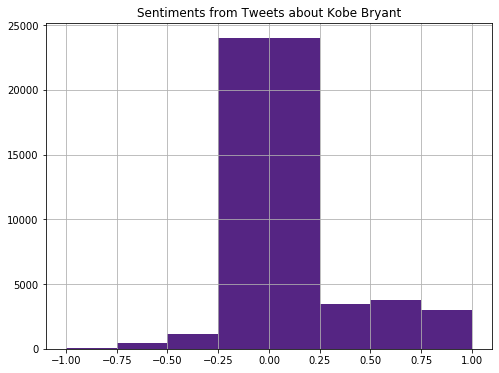

In [0]:
fig, ax = plt.subplots(figsize=(8, 6))

# Plot histogram of the polarity values
sentiment_df.hist(bins=[-1, -0.75, -0.5, -0.25, 0.25, 0.5, 0.75, 1],
             ax=ax,
             color="#552583")

plt.title("Sentiments from Tweets about Kobe Bryant")
plt.show()

### Isolating January 28th

In [0]:
jan28df = cleantwtdf[cleantwtdf['date'].str.contains('Jan 28',na=False)]
jan28df.head()

,id,date,time,timesec,cleantext,hashtags,polarity,new_sentiment
0,1,Jan 28,23:59:59,86399,"rt as i knew she would, brought a much-neede...",KobeBryant,0.80,1.00
1,2,Jan 28,23:59:58,86398,seeing trending and all these amazing fathers...,girldad,0.55,0.55
2,3,Jan 28,23:59:57,86397,rt i’m so moved by the outpouring of support ...,girldad,0.05,0.05
3,4,Jan 28,23:59:56,86396,rt first son of a nigerian (igbo) first son. ...,NaN,0.25,0.25
4,5,Jan 28,23:59:55,86395,"rt as i knew she would, brought a much-neede...",KobeBryant,0.80,1.00


Text(0.5, 1.0, 'Sentiment of Each Tweet on January 28th')

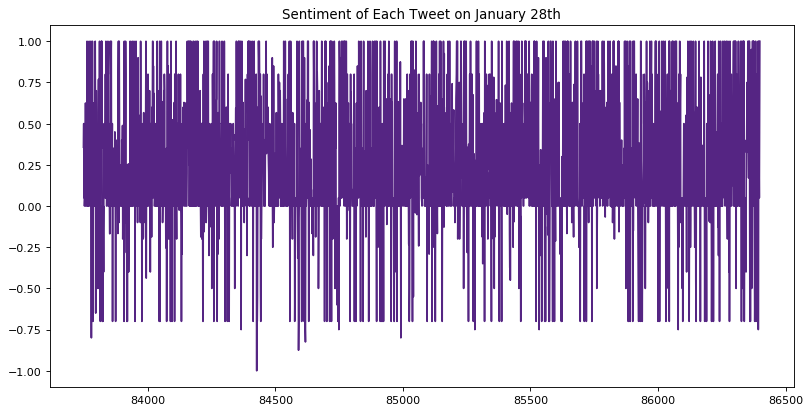

In [0]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(12,6), dpi=80, facecolor='w', edgecolor='k')
plt.plot(jan28df['timesec'],jan28df['new_sentiment'],color='#552583')
plt.title('Sentiment of Each Tweet on January 28th')

In [0]:
jan28df.new_sentiment.mean()

0.2519754955727543

### Mean sentiment by day

In [0]:
cleantwtgroup = cleantwtdf.groupby('date')
cleantwtgroup.head()
cleantwtsentmean = pd.DataFrame(cleantwtdf.groupby('date').mean())
cleantwtsentmean.head(10)

,id,timesec,polarity,new_sentiment
date,,,,
Feb 01,17604.000000,80233.181966,0.129858,0.129486
Feb 02,23364.993471,75462.052570,0.143377,0.150733
Feb 03,29051.000000,70176.495457,0.129360,0.130591
Feb 04,33802.000000,69821.821124,0.036821,0.112522
Jan 28,1236.500000,85064.325647,0.227163,0.251975
Jan 29,5815.000000,84085.466687,0.225393,0.224088
Jan 31,11990.500000,78943.753169,0.205567,0.103393


Text(0.5, 1.0, 'Mean Sentiment of Tweets by Day')

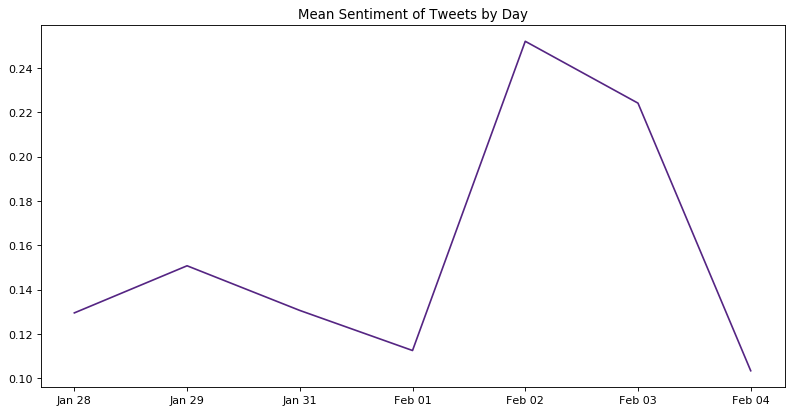

In [0]:
# plotting mean sentiment over each day
figure(num=None, figsize=(12,6), dpi=80, facecolor='w', edgecolor='k')

date = np.array(['Jan 28','Jan 29','Jan 31', 'Feb 01','Feb 02','Feb 03','Feb 04'])
plt.xticks(range(len(cleantwtsentmean['new_sentiment'])), date) # change order of x axis
plt.plot(cleantwtsentmean['new_sentiment'], color = '#552583')
plt.title('Mean Sentiment of Tweets by Day')


Text(0.5, 1.0, 'Mean Polarity of Tweets by Day')

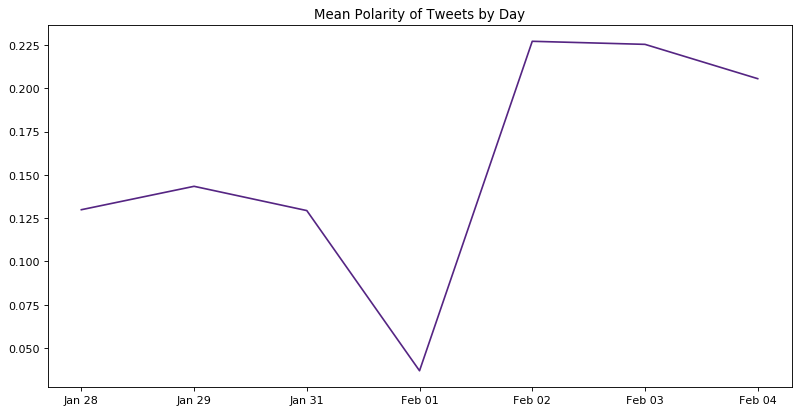

In [0]:
# plotting mean polarity over each day
figure(num=None, figsize=(12,6), dpi=80, facecolor='w', edgecolor='k')
plt.xticks(range(len(cleantwtsentmean['new_sentiment'])), date) # change order of x axis
plt.plot(cleantwtsentmean['polarity'], color = '#552583')
plt.title('Mean Polarity of Tweets by Day')

## Tweet Text Visualizations

In [0]:
# put all the clean tweets into a list
cleantwt = cleantwtdf['cleantext'].to_list()
twtlist = []
for twt in cleantwt:
    t = str(twt)
    twtlist.append(t)
twtlist[:30]

['rt  as i knew she would,  brought a much-needed perspective to the death of  proud of you, sis! \nh…',
 'seeing  trending and all these amazing fathers that love their daughters is making me so ',
 'rt  i’m so moved by the outpouring of support behind my story about kobe. and i love that  is trending.. so for all…',
 'rt  first son of a nigerian (igbo) first son. having a boy is basically mandatory, they said. to carry the name, they said\n\nyeah,…',
 'rt  as i knew she would,  brought a much-needed perspective to the death of  proud of you, sis! \nh…',
 'rt  this oscar winning short film about  hit different right now. rip ',
 'rt  what a tragic loss...      )     ',
 'rt  as i knew she would,  brought a much-needed perspective to the death of  proud of you, sis! \nh…',
 'rt  kobe wakes up in heaven this morning, a true man of god.  ',
 'all these  posts are making me ',
 'rt   and  pay their tribute to the late  on their latest episode of  ',
 'rt   and so proud to be ',
 'rt   my 

In [0]:
# remove hashtags + noise
patternh = re.compile('(#[\w]+)') # removes hidden hashtags
pattern1 = re.compile('(\\n)') #'\n'
pattern2 = re.compile('(https:.+)') #links at the end of tweets
pattern3 = re.compile('^(rt\s)') #rt phrase
pattern4 = re.compile('(&amp;)') # amp
pattern5 = re.compile('[^a-zA-Z0-9\s]+') #non word or non numerical characters

for i in range(len(twtlist)): 
        twtlist[i] = str(twtlist[i])
        twtlist[i] = twtlist[i].lower()
        twtlist[i] = patternh.sub('',twtlist[i])
        twtlist[i] = pattern1.sub(' ',twtlist[i])
        twtlist[i] = pattern2.sub('',twtlist[i])
        twtlist[i] = pattern3.sub('',twtlist[i])
        twtlist[i] = pattern4.sub(' ',twtlist[i])
        twtlist[i] = pattern5.sub(' ',twtlist[i])

print(twtlist[:30])
#print(len(twtlist))
print(type(twtlist[0]))

[' as i knew she would   brought a much needed perspective to the death of  proud of you  sis   h ', 'seeing  trending and all these amazing fathers that love their daughters is making me so ', ' i m so moved by the outpouring of support behind my story about kobe  and i love that  is trending  so for all ', ' first son of a nigerian  igbo  first son  having a boy is basically mandatory  they said  to carry the name  they said  yeah ', ' as i knew she would   brought a much needed perspective to the death of  proud of you  sis   h ', ' this oscar winning short film about  hit different right now  rip ', ' what a tragic loss             ', ' as i knew she would   brought a much needed perspective to the death of  proud of you  sis   h ', ' kobe wakes up in heaven this morning  a true man of god   ', 'all these  posts are making me ', '  and  pay their tribute to the late  on their latest episode of  ', '  and so proud to be ', '  my  with his  ', '  take court for pre game warmups all w

In [0]:
# stop words, add nan and rt
from nltk.corpus import stopwords
stopwords = nltk.corpus.stopwords.words('english')
stopwords.append('nan')
stopwords.append('rt')
'nan' in stopwords
'rt' in stopwords

True

In [0]:
# remove stop words from each tweet string but keep it in a list
print(twtlist[:10])

twtlist_nostop = []

for twt in twtlist:
    twt_tokens = word_tokenize(twt)
    twt_nostop = [word for word in twt_tokens if word not in stopwords]
    twt_sent_nostop = (" ").join(twt_nostop)
    twtlist_nostop.append(twt_sent_nostop)
    
print(twtlist_nostop[:10])

[' as i knew she would   brought a much needed perspective to the death of  proud of you  sis   h ', 'seeing  trending and all these amazing fathers that love their daughters is making me so ', ' i m so moved by the outpouring of support behind my story about kobe  and i love that  is trending  so for all ', ' first son of a nigerian  igbo  first son  having a boy is basically mandatory  they said  to carry the name  they said  yeah ', ' as i knew she would   brought a much needed perspective to the death of  proud of you  sis   h ', ' this oscar winning short film about  hit different right now  rip ', ' what a tragic loss             ', ' as i knew she would   brought a much needed perspective to the death of  proud of you  sis   h ', ' kobe wakes up in heaven this morning  a true man of god   ', 'all these  posts are making me ']
['knew would brought much needed perspective death proud sis h', 'seeing trending amazing fathers love daughters making', 'moved outpouring support behind 

In [0]:
# remove empty words from twtlist and create one list of all words (twts)
twts = []
for twt in twtlist:
    tw = twt.split(' ')
    for t in tw:
        if len(t) > 0: # don't add empty items
            twts.append(t)
print(twts[:50])

['as', 'i', 'knew', 'she', 'would', 'brought', 'a', 'much', 'needed', 'perspective', 'to', 'the', 'death', 'of', 'proud', 'of', 'you', 'sis', 'h', 'seeing', 'trending', 'and', 'all', 'these', 'amazing', 'fathers', 'that', 'love', 'their', 'daughters', 'is', 'making', 'me', 'so', 'i', 'm', 'so', 'moved', 'by', 'the', 'outpouring', 'of', 'support', 'behind', 'my', 'story', 'about', 'kobe', 'and', 'i']


In [0]:
# most frequent words before cleaning
import collections
twtcounts = Counter(twts)
freqtwts = twtcounts.most_common(30)
freqtwts100 = twtcounts.most_common(100)
print(freqtwts)

[('the', 19358), ('a', 14973), ('to', 14775), ('i', 10509), ('of', 10506), ('kobe', 9185), ('and', 9174), ('in', 8379), ('my', 7457), ('is', 6247), ('this', 6130), ('you', 6114), ('for', 5658), ('s', 5430), ('on', 4679), ('bryant', 4531), ('was', 4507), ('be', 3549), ('his', 3531), ('it', 3370), ('all', 3357), ('he', 3241), ('with', 3129), ('t', 3067), ('that', 3003), ('so', 2858), ('one', 2787), ('daughter', 2710), ('being', 2703), ('but', 2649)]


In [0]:
# count of all words in all tweets
print(len(twts)) # 487150

487150


In [0]:
# create one list of all words from twtlist_nostop
twts = []
for twt in twtlist_nostop:
    tw = twt.split(' ')
    for t in tw:
        twts.append(t)
print(twts[:50])

['knew', 'would', 'brought', 'much', 'needed', 'perspective', 'death', 'proud', 'sis', 'h', 'seeing', 'trending', 'amazing', 'fathers', 'love', 'daughters', 'making', 'moved', 'outpouring', 'support', 'behind', 'story', 'kobe', 'love', 'trending', 'first', 'son', 'nigerian', 'igbo', 'first', 'son', 'boy', 'basically', 'mandatory', 'said', 'carry', 'name', 'said', 'yeah', 'knew', 'would', 'brought', 'much', 'needed', 'perspective', 'death', 'proud', 'sis', 'h', 'oscar']


In [0]:
# most frequent words after stop words are removed
import collections
twtcounts = Counter(twts)
freqtwts = twtcounts.most_common(30)
freqtwts100 = twtcounts.most_common(100)
print(freqtwts)

[('kobe', 9187), ('bryant', 4531), ('one', 2787), ('daughter', 2710), ('love', 2449), ('tribute', 2198), ('like', 1827), ('ever', 1812), ('court', 1696), ('much', 1652), ('gigi', 1580), ('game', 1512), ('career', 1507), ('games', 1464), ('apart', 1439), ('toughest', 1423), ('lebron', 1364), ('man', 1323), ('24', 1311), ('said', 1295), ('proud', 1291), ('thank', 1276), ('w', 1222), ('via', 1177), ('beautiful', 1170), ('thought', 1157), ('anyone', 1150), ('got', 1124), ('case', 1083), ('see', 1075)]


In [0]:
twtfd = {}
for twt in freqtwts:
    key = twt[0]
    val = twt[1]
    twtfd[key] = val

print(twtfd)

twtfd100 = {}
for twt in freqtwts100:
    key = twt[0]
    val = twt[1]
    twtfd100[key] = val

{'kobe': 9187, 'bryant': 4531, 'one': 2787, 'daughter': 2710, 'love': 2449, 'tribute': 2198, 'like': 1827, 'ever': 1812, 'court': 1696, 'much': 1652, 'gigi': 1580, 'game': 1512, 'career': 1507, 'games': 1464, 'apart': 1439, 'toughest': 1423, 'lebron': 1364, 'man': 1323, '24': 1311, 'said': 1295, 'proud': 1291, 'thank': 1276, 'w': 1222, 'via': 1177, 'beautiful': 1170, 'thought': 1157, 'anyone': 1150, 'got': 1124, 'case': 1083, 'see': 1075}


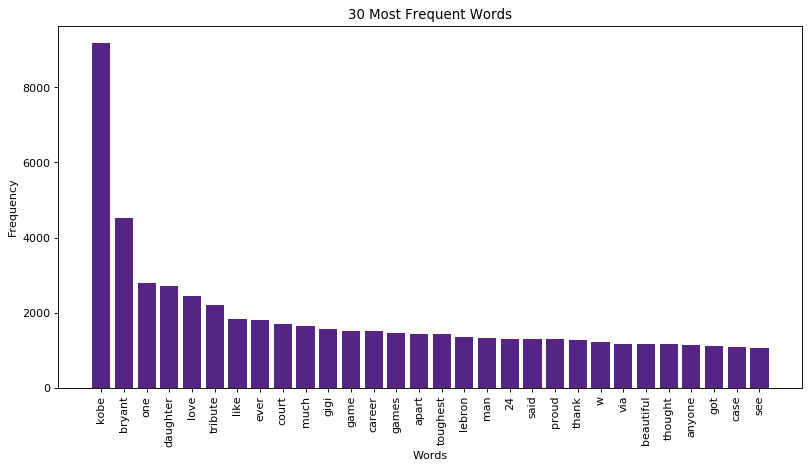

In [0]:
figure(num=None, figsize=(12,6), dpi=80, facecolor='w', edgecolor='k')
plt.bar(range(len(twtfd)), list(twtfd.values()), align='center', color='#552583')
plt.xticks(range(len(twtfd)), list(twtfd.keys()),rotation=90)
# Add title and axis names
plt.title('30 Most Frequent Words')
plt.xlabel('Words')
plt.ylabel('Frequency')

plt.show()

In [0]:
#### Color function for word clouds

def laker_color_func(word, font_size, position, orientation, random_state=None,
                    **kwargs):
    return "hsl(41, 100%%, %d%%)" % random.randint(40, 75)

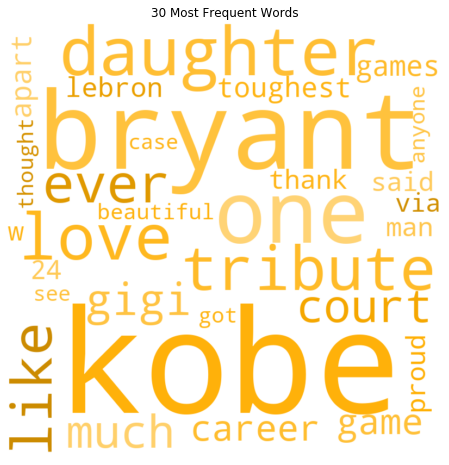

<Figure size 432x288 with 0 Axes>

In [0]:
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white',
                min_font_size = 10).generate_from_frequencies(twtfd) 

plt.figure(figsize = (8, 8), facecolor = None) 
plt.title("30 Most Frequent Words")
plt.imshow(wordcloud.recolor(color_func=laker_color_func, random_state=3),
           interpolation="bilinear")
plt.axis("off")
plt.figure()
plt.show()

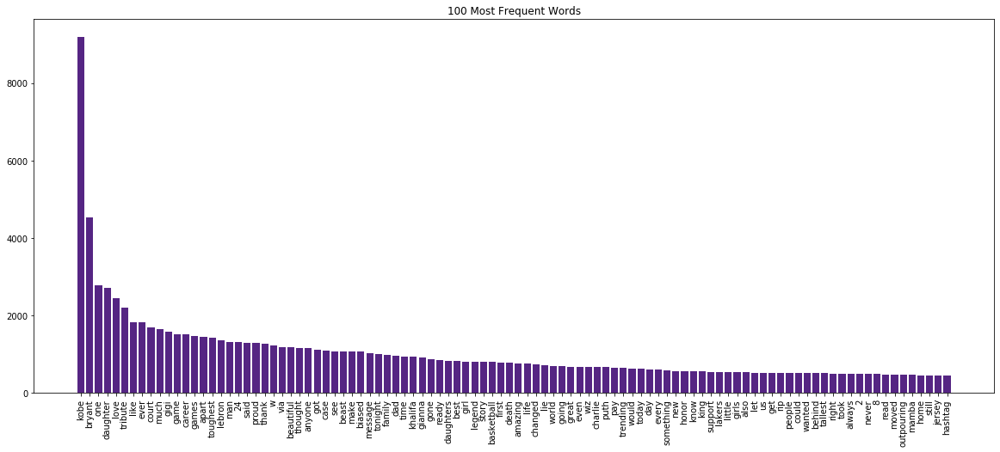

In [0]:
plt.figure(figsize = (20, 8), facecolor = None) 
plt.bar(range(len(twtfd100)), list(twtfd100.values()), align='center',color='#552583')
plt.xticks(range(len(twtfd100)), list(twtfd100.keys()),rotation=90)
plt.title('100 Most Frequent Words')
plt.show()

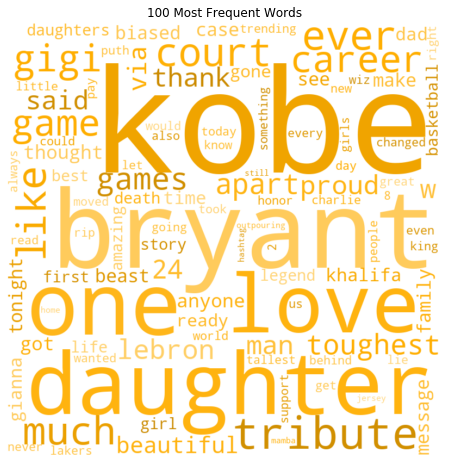

<Figure size 432x288 with 0 Axes>

In [0]:
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white',
                min_font_size = 10).generate_from_frequencies(twtfd100) 

plt.figure(figsize = (8, 8), facecolor = None) 
plt.title("100 Most Frequent Words")
plt.imshow(wordcloud.recolor(color_func=laker_color_func, random_state=3),
           interpolation="bilinear")
plt.axis("off")
plt.figure()
plt.show()

## Bigram Visualization

In [0]:
twtbgs = []
for i in range(len(twtlist)): 
    twtbg = list(nltk.bigrams(twtlist[i].split()))
    twtbgs.append(twtbg)
print(twtbgs[:10])

[[('as', 'i'), ('i', 'knew'), ('knew', 'she'), ('she', 'would'), ('would', 'brought'), ('brought', 'a'), ('a', 'much'), ('much', 'needed'), ('needed', 'perspective'), ('perspective', 'to'), ('to', 'the'), ('the', 'death'), ('death', 'of'), ('of', 'proud'), ('proud', 'of'), ('of', 'you'), ('you', 'sis'), ('sis', 'h')], [('seeing', 'trending'), ('trending', 'and'), ('and', 'all'), ('all', 'these'), ('these', 'amazing'), ('amazing', 'fathers'), ('fathers', 'that'), ('that', 'love'), ('love', 'their'), ('their', 'daughters'), ('daughters', 'is'), ('is', 'making'), ('making', 'me'), ('me', 'so')], [('i', 'm'), ('m', 'so'), ('so', 'moved'), ('moved', 'by'), ('by', 'the'), ('the', 'outpouring'), ('outpouring', 'of'), ('of', 'support'), ('support', 'behind'), ('behind', 'my'), ('my', 'story'), ('story', 'about'), ('about', 'kobe'), ('kobe', 'and'), ('and', 'i'), ('i', 'love'), ('love', 'that'), ('that', 'is'), ('is', 'trending'), ('trending', 'so'), ('so', 'for'), ('for', 'all')], [('first', '

In [0]:
# need it to be in format: ['word1 word 2','word2 word3',...]

twtbglist = []

for line in twtbgs:
    for pair in line:
        twtbglist.append(str(pair))
        
pattern = re.compile('[^a-zA-Z0-9\s]+')

for i in range(len(twtbglist)): 
        twtbglist[i] = str(twtbglist[i])
        twtbglist[i] = twtbglist[i].lower()
        twtbglist[i] = pattern.sub('', twtbglist[i])
        #twtlist[i] = pattern2.sub('',twtlist[i])
        #twtlist[i] = pattern3.sub('',twtlist[i])

print(twtbglist[:10])

['as i', 'i knew', 'knew she', 'she would', 'would brought', 'brought a', 'a much', 'much needed', 'needed perspective', 'perspective to']


In [0]:
import collections
bgcounts = Counter(twtbglist)
frequentbg = bgcounts.most_common(30)
frequentbg100 = bgcounts.most_common(100)
print(frequentbg)

[('kobe bryant', 3706), ('of the', 2288), ('to be', 2130), ('one of', 2037), ('being a', 1934), ('on the', 1739), ('i m', 1618), ('in my', 1585), ('was a', 1447), ('of in', 1441), ('i ever', 1424), ('the toughest', 1419), ('apart of', 1418), ('ever been', 1416), ('my career', 1415), ('games i', 1414), ('toughest games', 1413), ('been apart', 1413), ('is a', 1355), ('be a', 1317), ('tribute to', 1257), ('the court', 1253), ('thank you', 1251), ('kobe was', 1232), ('in the', 1200), ('to the', 1185), ('it s', 1171), ('when he', 1109), ('gigi was', 1094), ('he said', 1085)]


In [0]:
twtbgfd = {}
for tag in frequentbg:
    key = tag[0]
    val = tag[1]
    twtbgfd[key] = val

print(twtbgfd)

twtbgfd100 = {}
for tag in frequentbg100:
    key = tag[0]
    val = tag[1]
    twtbgfd100[key] = val

{'kobe bryant': 3706, 'of the': 2288, 'to be': 2130, 'one of': 2037, 'being a': 1934, 'on the': 1739, 'i m': 1618, 'in my': 1585, 'was a': 1447, 'of in': 1441, 'i ever': 1424, 'the toughest': 1419, 'apart of': 1418, 'ever been': 1416, 'my career': 1415, 'games i': 1414, 'toughest games': 1413, 'been apart': 1413, 'is a': 1355, 'be a': 1317, 'tribute to': 1257, 'the court': 1253, 'thank you': 1251, 'kobe was': 1232, 'in the': 1200, 'to the': 1185, 'it s': 1171, 'when he': 1109, 'gigi was': 1094, 'he said': 1085}


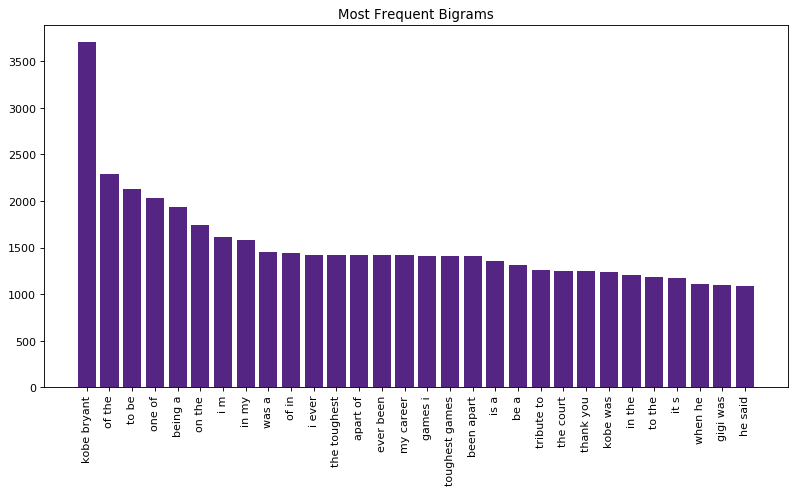

In [0]:
figure(num=None, figsize=(12,6), dpi=80, facecolor='w', edgecolor='k')
plt.bar(range(len(twtbgfd)), list(twtbgfd.values()), align='center',color='#552583')
plt.xticks(range(len(twtbgfd)), list(twtbgfd.keys()),rotation=90)
plt.title('Most Frequent Bigrams')

plt.show()

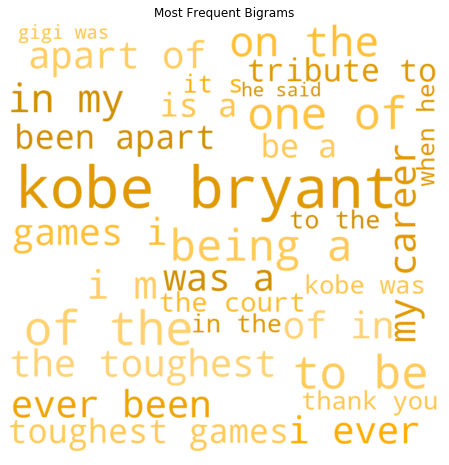

<Figure size 432x288 with 0 Axes>

In [0]:
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white',
                min_font_size = 10).generate_from_frequencies(twtbgfd) 

plt.figure(figsize = (8, 8), facecolor = None) 
plt.title("Most Frequent Bigrams")
plt.imshow(wordcloud.recolor(color_func=laker_color_func, random_state=3),
           interpolation="bilinear")
plt.axis("off")
plt.figure()
plt.show()

## Hashtag Visualizations

In [0]:
hashtags = cleantwtdf['hashtags'].to_list()
hashtaglist = []
for tag in hashtags:
    t = str(tag).split(',')
    for x in t:
        x = x.strip()
        hashtaglist.append(x)
hashtaglist[:20]

['KobeBryant',
 'girldad',
 'girldad',
 'nan',
 'KobeBryant',
 'Kobe',
 'KobeBryant',
 'rip',
 'nowords',
 'JimmyRich',
 'flashback',
 'legend',
 'KobeBryant',
 'KobeRIP',
 'girldad',
 'KobeBryant',
 'girldad',
 'Girldad',
 'kobe',
 'badbunny']

In [0]:
for i in range(len(hashtaglist)): 
        hashtaglist[i] = str(hashtaglist[i])
        hashtaglist[i] = hashtaglist[i].lower()
        
hashtaglist[:10]

['kobebryant',
 'girldad',
 'girldad',
 'nan',
 'kobebryant',
 'kobe',
 'kobebryant',
 'rip',
 'nowords',
 'jimmyrich']

In [0]:
hashtagstrcloud = ' '

for tag in hashtaglist: 
    hashtagstrcloud = hashtagstrcloud + tag + ' '
hashtagstrcloud[:20]

' kobebryant girldad '

In [0]:
hashtagsplitlist = hashtagstrcloud.split()
hashtagsplitlist[:20]

['kobebryant',
 'girldad',
 'girldad',
 'nan',
 'kobebryant',
 'kobe',
 'kobebryant',
 'rip',
 'nowords',
 'jimmyrich',
 'flashback',
 'legend',
 'kobebryant',
 'koberip',
 'girldad',
 'kobebryant',
 'girldad',
 'girldad',
 'kobe',
 'badbunny']

In [0]:
print(len(hashtagsplitlist))
for tag in hashtagsplitlist:
    if tag in stopwords:
        hashtagsplitlist.remove(tag)
print(len(hashtagsplitlist)) # run until 51572

58451
52814


In [0]:
hashtagsplitlist[:20]

['kobebryant',
 'girldad',
 'girldad',
 'kobebryant',
 'kobe',
 'kobebryant',
 'rip',
 'nowords',
 'jimmyrich',
 'flashback',
 'legend',
 'kobebryant',
 'koberip',
 'girldad',
 'kobebryant',
 'girldad',
 'girldad',
 'kobe',
 'badbunny',
 'kobebryant']

In [0]:
import collections
counts = Counter(hashtagsplitlist)
frequenttags = counts.most_common(30)
print(frequenttags)

[('girldad', 11335), ('kobebryant', 7025), ('kobe', 6047), ('mambaforever', 2256), ('mambamentality', 1291), ('nan', 1241), ('rememberingkobe', 1191), ('ripkobebryant', 1087), ('girldads', 735), ('gigi', 724), ('lakers', 711), ('koberip', 699), ('kobeandgigi', 470), ('superbowl', 428), ('dubai', 402), ('burjkhalifa', 361), ('kobetribute', 359), ('ripkobe', 351), ('lakeshow', 293), ('nba', 290), ('ripgiannabryant', 263), ('blackmamba', 263), ('ripmamba', 247), ('pressplay', 244), ('mambaout', 231), ('kobeandgianna', 185), ('kobeforever', 180), ('staplescenter', 164), ('mamba', 157), ('giannabryant', 148)]


In [0]:
hashtagfd = {}
for tag in frequenttags:
    key = tag[0]
    val = tag[1]
    hashtagfd[key] = val

print(hashtagfd)

{'girldad': 11335, 'kobebryant': 7025, 'kobe': 6047, 'mambaforever': 2256, 'mambamentality': 1291, 'nan': 1241, 'rememberingkobe': 1191, 'ripkobebryant': 1087, 'girldads': 735, 'gigi': 724, 'lakers': 711, 'koberip': 699, 'kobeandgigi': 470, 'superbowl': 428, 'dubai': 402, 'burjkhalifa': 361, 'kobetribute': 359, 'ripkobe': 351, 'lakeshow': 293, 'nba': 290, 'ripgiannabryant': 263, 'blackmamba': 263, 'ripmamba': 247, 'pressplay': 244, 'mambaout': 231, 'kobeandgianna': 185, 'kobeforever': 180, 'staplescenter': 164, 'mamba': 157, 'giannabryant': 148}


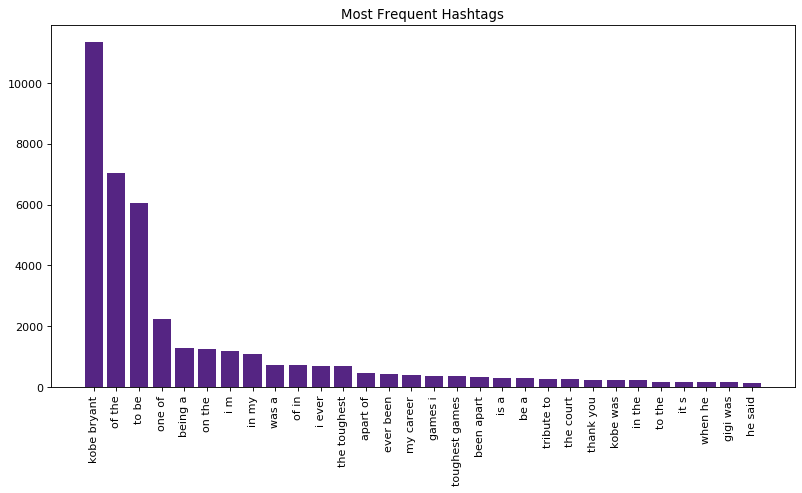

In [0]:
figure(num=None, figsize=(12,6), dpi=80, facecolor='w', edgecolor='k')
plt.bar(range(len(hashtagfd)), list(hashtagfd.values()), align='center',color='#552583')
plt.xticks(range(len(twtbgfd)), list(twtbgfd.keys()),rotation=90)
plt.title('Most Frequent Hashtags')

plt.show()

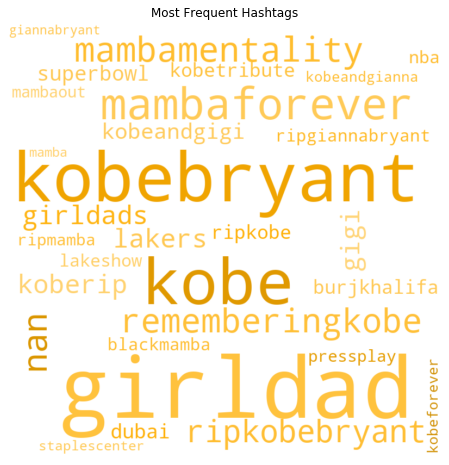

<Figure size 432x288 with 0 Axes>

In [0]:
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='#FFFFFF',
                min_font_size = 10).generate_from_frequencies(hashtagfd)

plt.figure(figsize = (8, 8), facecolor = None) 
plt.title("Most Frequent Hashtags")
plt.imshow(wordcloud.recolor(color_func=laker_color_func, random_state=3),
           interpolation="bilinear")
plt.axis("off")
plt.figure()
plt.show()

## Sentiment Polarity by Day
* do this by topic as well

In [0]:
import plotly
import plotly.graph_objects as go
y0 = cleantwtdf.loc[df['date'] == 'Jan 28']['polarity']
y1 = cleantwtdf.loc[df['date'] == 'Jan 29']['polarity']
y2 = cleantwtdf.loc[df['date'] == 'Jan 31']['polarity']
y3 = cleantwtdf.loc[df['date'] == 'Feb 01']['polarity']
y4 = cleantwtdf.loc[df['date'] == 'Feb 02']['polarity']
y5 = cleantwtdf.loc[df['date'] == 'Feb 03']['polarity']
y6 = cleantwtdf.loc[df['date'] == 'Feb 04']['polarity']

trace0 = go.Box(
    y=y0,
    name = 'Jan 28',
    marker = dict(
        color = 'rgb(214, 12, 140)',
    )
)
trace1 = go.Box(
    y=y1,
    name = 'Jan 29',
    marker = dict(
        color = 'rgb(0, 128, 128)',
    )
)
trace2 = go.Box(
    y=y2,
    name = 'Jan 31',
    marker = dict(
        color = 'rgb(10, 140, 208)',
    )
)
trace3 = go.Box(
    y=y3,
    name = 'Feb 01',
    marker = dict(
        color = 'rgb(12, 102, 14)',
    )
)
trace4 = go.Box(
    y=y4,
    name = 'Feb 02',
    marker = dict(
        color = 'rgb(10, 0, 100)',
    )
)
trace5 = go.Box(
    y=y5,
    name = 'Feb 03',
    marker = dict(
        color = 'rgb(100, 0, 10)',
    )
)
trace6 = go.Box(
    y=y6,
    name = 'Feb 04',
    marker = dict(
        color = 'rgb(175, 132, 48)',
    )
)
data = [trace0, trace1, trace2, trace3, trace4, trace5, trace6]
layout = go.Layout(
    title = "Sentiment Polarity by Day"
)

fig = go.Figure(data=data,layout=layout)
#iplot(fig, filename = "Sentiment Polarity Boxplot of Department Name")
fig.show()

# Topic Modeling

In [0]:
topicvec=CountVectorizer(input="content",min_df=2, stop_words='english') # not including stop words because content is already cleaned

topvecmatrix = topicvec.fit_transform(twtlist_nostop) # creates a sparse matrix
print(type(topvecmatrix))
vocab = topicvec.get_feature_names()

<class 'scipy.sparse.csr.csr_matrix'>


In [0]:
topdtm = topvecmatrix.toarray()  # convert to a regular array
print(list(vocab)[10:20])
ColumnNames=topicvec.get_feature_names()
topdtmdf=pd.DataFrame(topdtm,columns=ColumnNames)
print(topdtmdf)

['0711', '07748', '07769', '0n', '0x0b00bfccdb0fe1fc3a3250427fa57b6e77bbe6f3', '10', '100', '1000', '100th', '101']
       00  000  005  00pm  01  02  024  03  04  06  ...  zelophehad  zero  \
0       0    0    0     0   0   0    0   0   0   0  ...           0     0   
1       0    0    0     0   0   0    0   0   0   0  ...           0     0   
2       0    0    0     0   0   0    0   0   0   0  ...           0     0   
3       0    0    0     0   0   0    0   0   0   0  ...           0     0   
4       0    0    0     0   0   0    0   0   0   0  ...           0     0   
...    ..  ...  ...   ...  ..  ..  ...  ..  ..  ..  ...         ...   ...   
35831   0    0    0     0   0   0    0   0   0   0  ...           0     0   
35832   0    0    0     0   0   0    0   0   0   0  ...           0     0   
35833   0    0    0     0   0   0    0   0   0   0  ...           0     0   
35834   0    0    0     0   0   0    0   0   0   0  ...           0     0   
35835   0    0    0     0   0   0    

In [0]:
from sklearn.decomposition import NMF, LatentDirichletAllocation, TruncatedSVD

In [0]:
num_topics = 3

lda_model_kobe = LatentDirichletAllocation(n_components=num_topics, 
                                         max_iter=100, learning_method='online')
#lda_model = LatentDirichletAllocation(n_components=NUM_TOPICS, max_iter=10, learning_method='online')
LDA_kobe_Model = lda_model_kobe.fit_transform(topdtmdf)

In [0]:
print("SIZE: ", LDA_kobe_Model.shape)  # (NO_DOCUMENTS, NO_TOPICS)

SIZE:  (35836, 3)


In [0]:
def print_topics(model, vectorizer, top_n=10):
    for idx, topic in enumerate(model.components_):
        print("Topic:  ", idx)
      
        print([(vectorizer.get_feature_names()[i], topic[i])
                        for i in topic.argsort()[:-top_n - 1:-1]])
                        ## gets top n elements in decreasing order

In [0]:
print_topics(lda_model_kobe, topicvec)

Topic:   0
[('connecting', 2937.0272761653796), ('imaginable', 1841.5225033203476), ('famil', 1312.1350875501855), ('completely', 1086.6579959004866), ('duo', 1083.4407595339958), ('road', 1061.625664851943), ('inviti', 1058.311412407261), ('innovation', 980.1301092203051), ('babes', 925.5581231501767), ('conspiracy', 910.8200764188557)]
Topic:   1
[('boo', 4501.045135148766), ('honoured', 4275.373437035313), ('excuses', 2330.5946688323415), ('sandiat', 2276.79722144646), ('brows', 1507.8495457706924), ('hyper', 1442.7578055606857), ('animals', 1438.6269691704315), ('rubik', 1424.262451730265), ('23', 1331.4343554424568), ('retired', 1289.632213147541)]
Topic:   2
[('honoured', 4839.888156670143), ('innovation', 1795.6399863399802), ('performed', 1758.3431074214507), ('famed', 1550.3599376242948), ('coaches', 1374.558430224296), ('rey', 1236.0918568494708), ('mz', 1221.9580058823349), ('bts', 1053.3639718462373), ('bag', 1039.2248658530061), ('bay', 1028.5984242484915)]


### Now let's try lemmatizing the words to see if topic modeling improves

In [0]:
from nltk.stem import WordNetLemmatizer 
from nltk.corpus.reader.wordnet import NOUN
from nltk.corpus import wordnet

def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}
    return tag_dict.get(tag, wordnet.NOUN)
  
lemmatizer = WordNetLemmatizer() 

In [0]:
# remove stop words from each tweet string but keep it in a list and lemmatize tokens
print(twtlist_nostop[:10])

twtlist_lem = []

for twt in twtlist:
    twt_tokens = word_tokenize(twt)
    twt_lem = [lemmatizer.lemmatize(tok, get_wordnet_pos(tok)) for tok in twt_tokens]
    twt_nostop = [word for word in twt_lem if word not in stopwords]
    twt_lem_nostop = (" ").join(twt_nostop)
    twtlist_lem.append(twt_lem_nostop)
    
print(twtlist_lem[:10])

['knew would brought much needed perspective death proud sis h', 'seeing trending amazing fathers love daughters making', 'moved outpouring support behind story kobe love trending', 'first son nigerian igbo first son boy basically mandatory said carry name said yeah', 'knew would brought much needed perspective death proud sis h', 'oscar winning short film hit different right rip', 'tragic loss', 'knew would brought much needed perspective death proud sis h', 'kobe wakes heaven morning true man god', 'posts making']
['knew would brought much need perspective death proud si h', 'see trend amaze father love daughter make', 'move outpouring support behind story kobe love trend', 'first son nigerian igbo first son boy basically mandatory say carry name say yeah', 'knew would brought much need perspective death proud si h', 'oscar win short film hit different right rip', 'tragic loss', 'knew would brought much need perspective death proud si h', 'kobe wake heaven morning true man god', 'pos

In [0]:
topicvec_lem=CountVectorizer(input="content",min_df=2, stop_words='english') # not including stop words because content is already cleaned

topvecmatrix_lem = topicvec_lem.fit_transform(twtlist_lem) # creates a sparse matrix
print(type(topvecmatrix_lem))
vocablem = topicvec_lem.get_feature_names()

<class 'scipy.sparse.csr.csr_matrix'>


In [0]:
topdtm_lem = topvecmatrix_lem.toarray()  # convert to a regular array
print(list(vocablem)[10:20])
ColumnNames=topicvec_lem.get_feature_names()
topdtmdf_lem=pd.DataFrame(topdtm_lem,columns=ColumnNames)
print(topdtmdf_lem)

['0711', '07748', '07769', '0n', '0x0b00bfccdb0fe1fc3a3250427fa57b6e77bbe6f3', '10', '100', '1000', '100th', '101']
       00  000  005  00pm  01  02  024  03  04  06  ...  zero  \
0       0    0    0     0   0   0    0   0   0   0  ...     0   
1       0    0    0     0   0   0    0   0   0   0  ...     0   
2       0    0    0     0   0   0    0   0   0   0  ...     0   
3       0    0    0     0   0   0    0   0   0   0  ...     0   
4       0    0    0     0   0   0    0   0   0   0  ...     0   
...    ..  ...  ...   ...  ..  ..  ...  ..  ..  ..  ...   ...   
35831   0    0    0     0   0   0    0   0   0   0  ...     0   
35832   0    0    0     0   0   0    0   0   0   0  ...     0   
35833   0    0    0     0   0   0    0   0   0   0  ...     0   
35834   0    0    0     0   0   0    0   0   0   0  ...     0   
35835   0    0    0     0   0   0    0   0   0   0  ...     0   

       zeroideapodcast  zhuri  zion  zobayan  zoe  zoey  zone  zoo  zoom  
0                    0      

In [0]:
num_topics = 4

lda_model_kobe_lem = LatentDirichletAllocation(n_components=num_topics, 
                                         max_iter=100, learning_method='online')
#lda_model = LatentDirichletAllocation(n_components=NUM_TOPICS, max_iter=10, learning_method='online')
LDA_kobe_Model_lem = lda_model_kobe_lem.fit_transform(topdtmdf_lem)

In [0]:
print("SIZE: ", LDA_kobe_Model_lem.shape)  # (NO_DOCUMENTS, NO_TOPICS)
print_topics(lda_model_kobe_lem, topicvec_lem)

SIZE:  (35836, 4)
Topic:   0
[('kobe', 3797.513406006744), ('bryant', 3608.6200820008644), ('game', 3027.60218129172), ('career', 1507.768487847467), ('apart', 1438.5442986032078), ('toughest', 1424.1805172986035), ('make', 1412.146064717412), ('thank', 1289.5458871686058), ('message', 1079.1294284117382), ('tonight', 988.037528902172)]
Topic:   1
[('kobe', 2022.1858503709236), ('court', 1666.5370025244495), ('gigi', 1550.289608038791), ('say', 1540.3634549807487), ('lebron', 1442.6934354587431), ('tribute', 1427.0355760003577), ('thought', 1236.0141073646016), ('honor', 1065.0985291200257), ('case', 1053.2822166139656), ('beast', 1039.141732223143)]
Topic:   2
[('girl', 1312.0615808277826), ('kobe', 1165.2999975739356), ('family', 1129.6941360223293), ('dad', 1086.586767777535), ('time', 925.8079609645584), ('life', 913.0928509367492), ('day', 910.7598087682751), ('bryant', 892.6587928609115), ('daughter', 830.0228548064267), ('best', 810.7403241445389)]
Topic:   3
[('love', 2775.3607

In [0]:
num_topics = 8

lda_model_kobe_lem = LatentDirichletAllocation(n_components=num_topics, 
                                         max_iter=100, learning_method='online')
#lda_model = LatentDirichletAllocation(n_components=NUM_TOPICS, max_iter=10, learning_method='online')
LDA_kobe_Model_lem = lda_model_kobe_lem.fit_transform(topdtmdf_lem)

In [0]:
print("SIZE: ", LDA_kobe_Model_lem.shape)  # (NO_DOCUMENTS, NO_TOPICS)
print_topics(lda_model_kobe_lem, topicvec_lem)

SIZE:  (35836, 8)
Topic:   0
[('bryant', 3607.794681960414), ('kobe', 2980.547880989321), ('career', 1507.6463459942147), ('toughest', 1424.0557941745053), ('message', 1079.0066303190972), ('khalifa', 938.9504817105869), ('thank', 832.7738733699842), ('wiz', 669.0469824008198), ('charlie', 664.0448203792115), ('puth', 664.0448203792115)]
Topic:   1
[('game', 3027.5052855195145), ('tribute', 1703.5326076315653), ('make', 1431.4911758361686), ('family', 1129.5935328756032), ('dad', 1086.481506981906), ('girl', 1069.5142521118958), ('pay', 1067.2522131572262), ('life', 913.0096755144364), ('best', 810.6352742661617), ('post', 683.2958886277436)]
Topic:   2
[('court', 1666.4183568320848), ('thought', 1235.8945545993906), ('basketball', 925.4516528704435), ('change', 901.3648548618589), ('great', 899.7372791209049), ('world', 833.3074930447536), ('lie', 733.5447754557898), ('king', 545.6306544432431), ('tallest', 519.9519344449044), ('gift', 513.0338423171104)]
Topic:   3
[('daughter', 3127

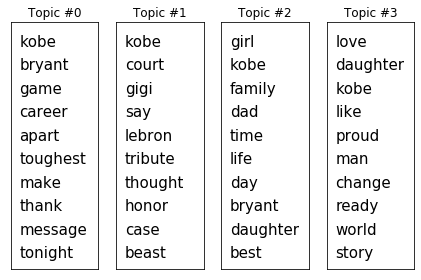

In [0]:
word_topic = np.array(lda_model_kobe_lem.components_)
word_topic = word_topic.transpose()

num_top_words = 10
vocab_array = np.asarray(vocablem)

#fontsize_base = 70 / np.max(word_topic) # font size for word with largest share in corpus
fontsize_base = 15
#plt.figure(figsize = (20, 8), facecolor = None) 
for t in range(num_topics):
    plt.subplot(1, num_topics, t + 1)  # plot numbering starts with 1
    plt.ylim(0, num_top_words + 0.5)  # stretch the y-axis to accommodate the words
    plt.xticks([])  # remove x-axis markings ('ticks')
    plt.yticks([]) # remove y-axis markings ('ticks')
    plt.title('Topic #{}'.format(t))
    top_words_idx = np.argsort(word_topic[:,t])[::-1]  # descending order
    top_words_idx = top_words_idx[:num_top_words]
    top_words = vocab_array[top_words_idx]
    top_words_shares = word_topic[top_words_idx, t]
    for i, (word, share) in enumerate(zip(top_words, top_words_shares)):
        plt.text(0.1, num_top_words-i-0.5, word, fontsize=fontsize_base)
                 ##fontsize_base*share)

plt.tight_layout()
plt.show()


## Exploring interesting key words

In [0]:
# 'story' kept coming up in some topic lists
keywords = ['story','lebron','tribute','honor','beast','career']

s = 0;

for i in twtlist:
    myLista = i.split(" ")
    needList = []
    for wrd in myLista:
        if wrd in keywords:
            s = s+1
            print(i)
            
        else:
            s=s

 i m so moved by the outpouring of support behind my story about kobe  and i love that  is trending  so for all 
  and  pay their tribute to the late  on their latest episode of  
can someone  me when the  story of the actual facts from the investigative report of the tragic helicopter crash o  
    an artist created a beautiful and impressive drawing made out of snow in honor of the legendary 
 i m so moved by the outpouring of support behind my story about kobe  and i love that  is trending  so for all 
 i m so moved by the outpouring of support behind my story about kobe  and i love that  is trending  so for all 
 i m so moved by the outpouring of support behind my story about kobe  and i love that  is trending  so for all 
 amazing story about kobe   i m a proud  and wouldn t have it any other way  
 i m so moved by the outpouring of support behind my story about kobe  and i love that  is trending  so for all 
 i m so moved by the outpouring of support behind my story about kobe  a